In [1]:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import os
import torch
from torch import nn
from torch.autograd import Variable
from torchvision import transforms
import torchvision.datasets as dset
import torchvision.utils as vutils

from torchinfo import summary

from PIL import Image
from scipy.spatial import distance
import json
from collections import defaultdict

import psycopg2

import fiftyone.zoo as foz

from pycocotools.coco import COCO
%matplotlib inline

Loads the COCO 2017 dataset using the FiftyOne framework.
https://docs.voxel51.com/integrations/coco.html
- This function loads the COCO 2017 dataset and returns a subset of the dataset
containing only the 'person' class detections. 

In [15]:
#Downloading 1500 samples for "person" class - train split
main_dataset = foz.load_zoo_dataset(
            "coco-2017",
            split="train",
            label_types=["detections"],
            classes=['person'],
            max_samples=1500,
        )

Found annotations at '/Users/krutikasavani/fiftyone/coco-2017/raw/instances_train2017.json'
 100% |████████████████| 1500/1500 [46.1s elapsed, 0s remaining, 35.3 images/s]      
Writing annotations for 1500 downloaded samples to '/Users/krutikasavani/fiftyone/coco-2017/train/labels.json'
Dataset info written to '/Users/krutikasavani/fiftyone/coco-2017/info.json'
Loading existing dataset 'coco-2017-train-1500'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


In [11]:
#Downloading 500 samples for "person" class - validation split

val_dataset= foz.load_zoo_dataset(
            "coco-2017",
            split="validation",
            label_types=["detections"],
            classes=['person'],
            max_samples=500,
        )

Found annotations at '/Users/krutikasavani/fiftyone/coco-2017/raw/instances_val2017.json'
 100% |██████████████████| 500/500 [14.8s elapsed, 0s remaining, 33.9 images/s]      
Writing annotations for 500 downloaded samples to '/Users/krutikasavani/fiftyone/coco-2017/validation/labels.json'
Dataset info written to '/Users/krutikasavani/fiftyone/coco-2017/info.json'
Loading 'coco-2017' split 'validation'
 100% |█████████████████| 500/500 [1.4s elapsed, 0s remaining, 346.4 samples/s]         
Dataset 'coco-2017-validation-500' created


In [16]:
# Downloading 3000 samples from each unique class  - train split

classes = ['car', 'cup', 'bottle', 'dining table','chair', 'bowl']
for i in classes:
    print("1000+ images found")
    try:
        dataset = foz.load_zoo_dataset(
            "coco-2017",
            split="train",
            label_types=["detections"],
            classes=[i],
            max_samples=3000,
        )
    except:
        print("1000+ images not found")
        dataset = foz.load_zoo_dataset(
            "coco-2017",
            split="train",
            label_types=["detections"],
            classes=[i],
        )
    main_dataset.merge_samples(dataset)

1000+ images found
Found annotations at '/Users/krutikasavani/fiftyone/coco-2017/raw/instances_train2017.json'
204 images found; downloading the remaining 2796
 100% |████████████████| 2796/2796 [1.4m elapsed, 0s remaining, 33.6 images/s]      
Writing annotations for 4296 downloaded samples to '/Users/krutikasavani/fiftyone/coco-2017/train/labels.json'
Dataset info written to '/Users/krutikasavani/fiftyone/coco-2017/info.json'
Loading existing dataset 'coco-2017-train-3000'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use
1000+ images found
Found annotations at '/Users/krutikasavani/fiftyone/coco-2017/raw/instances_train2017.json'
156 images found; downloading the remaining 2844
 100% |████████████████| 2844/2844 [1.3m elapsed, 0s remaining, 33.9 images/s]      
Writing annotations for 7140 downloaded samples to '/Users/krutikasavani/fiftyone/coco-2017/train/labels.json'
Dataset info written to '/Users/krutikasavani/fiftyone/coco-2017/

In [12]:
# Downloading 1000 samples from each unique class  - validation split

classes = ['car', 'cup', 'bottle', 'dining table','chair', 'bowl']
for i in classes:
    print("1000+ images found")
    try:
        val1_dataset = foz.load_zoo_dataset(
            "coco-2017",
            split="validation",
            label_types=["detections"],
            classes=[i],
            max_samples=1000,
        )
    except:
        print("1000+ images not found")
        val1_dataset = foz.load_zoo_dataset(
            "coco-2017",
            split="validation",
            label_types=["detections"],
            classes=[i],
        )
    val_dataset.merge_samples(val1_dataset)

1000+ images found
Found annotations at '/Users/krutikasavani/fiftyone/coco-2017/raw/instances_val2017.json'
Only found 535 (<1000) samples matching your requirements
57 images found; downloading the remaining 478
 100% |██████████████████| 478/478 [14.7s elapsed, 0s remaining, 36.2 images/s]      
Writing annotations for 978 downloaded samples to '/Users/krutikasavani/fiftyone/coco-2017/validation/labels.json'
Dataset info written to '/Users/krutikasavani/fiftyone/coco-2017/info.json'
Loading existing dataset 'coco-2017-validation-1000'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use
1000+ images found
Found annotations at '/Users/krutikasavani/fiftyone/coco-2017/raw/instances_val2017.json'
Only found 390 (<1000) samples matching your requirements
49 images found; downloading the remaining 341
 100% |██████████████████| 341/341 [9.8s elapsed, 0s remaining, 35.4 images/s]       
Writing annotations for 1319 downloaded samples to '/User

In [32]:
train_annotations_file = "/Users/krutikasavani/fiftyone/coco-2017/raw/instances_train2017.json"
val_annotations_file = "/Users/krutikasavani/fiftyone/coco-2017/raw/instances_val2017.json"

In [470]:
#Reading the objects-detected-dataframe from the json file 

from typing import List
filtered_df = pd.read_json('objects_df.json')
filtered_df=filtered_df.reset_index()
filtered_df = filtered_df.drop(["index"],axis=1)
filtered_df.head(5)

,Video_ID,Frame_ID,Object_file_name,Object_ID,Class,Confidence_Score,Bbox_Info
0,1,1-4,1-4-1,1,person,0.993100,"[511.833770752, 520.6685791016, 685.1188964844..."
1,1,1-14,1-14-1,1,person,0.999307,"[0.0, 114.4297485352, 494.4271240234, 792.2802..."
2,1,1-15,1-15-1,1,person,0.999412,"[0.0, 114.101348877, 491.3519897461, 789.72827..."
3,1,1-17,1-17-1,1,person,0.999388,"[3.8283996582, 134.8305969238, 515.2060546875,..."
4,1,1-28,1-28-1,1,person,0.999278,"[5.7371826172, 129.1081542969, 519.1452636719,..."


In [495]:
#filtered_df['Class'].value_counts()

person          416
car              18
cup              17
dining table     10
chair             8
bowl              8
bottle            7
Name: Class, dtype: int64

In [35]:
#Extracting bbox from train dataset to crop the objects from frames
objects_dict = defaultdict(list)

images_list = [i.lstrip("0").rstrip(".jpg") for i in os.listdir("/Users/krutikasavani/fiftyone/coco-2017/train/data/")]
class_list = [int(i) for i in filtered_df["Object_ID"]]
print(images_list)
with open(train_annotations_file, 'r') as f:
     coco = json.load(f)
for i in range(len(coco["annotations"])):
     
     if str(coco["annotations"][i]["image_id"]) in images_list and coco["annotations"][i]["category_id"] in class_list:
          image_id = coco["annotations"][i]["image_id"]
          bbox_info = coco["annotations"][i]["bbox"]
          class_id = coco["annotations"][i]["category_id"]

          objects_dict["image_id"].append(str(image_id))
          objects_dict["bbox_info"].append(bbox_info)
          objects_dict["class_id"].append(class_id)
#objects_dict
     

['54563', '76784', '188440', '10321', '113660', '236316', '169872', '72284', '108240', '111705', '5018', '138397', '108254', '14635', '48118', '113112', '50757', '2114', '84540', '6414', '80040', '12522', '220548', '186451', '221894', '17472', '49268', '102989', '55641', '99539', '171967', '98141', '97272', '13172', '48130', '142413', '41152', '58403', '7627', '102037', '51355', '231337', '105994', '3236', '48604', '93000', '24912', '45446', '2896', '181330', '93766', '123791', '59084', '82858', '29563', '32625', '74150', '87920', '109823', '156499', '159972', '70370', '10484', '30998', '131416', '176985', '55872', '177325', '137701', '46848', '144937', '49283', '70402', '241149', '89931', '35176', '74894', '1390', '211756', '16977', '132889', '112581', '38372', '59798', '57095', '132137', '104485', '133229', '172513', '78030', '80915', '64339', '53595', '157977', '23066', '14812', '52847', '5684', '172507', '103498', '28655', '16963', '77351', '27246', '75266', '72229', '120241', '139

In [36]:
#Extracting bbox from validation dataset to crop the objects from frames

val_objects_dict = defaultdict(list)

images_list = [i.lstrip("0").rstrip(".jpg") for i in os.listdir("/Users/krutikasavani/fiftyone/coco-2017/validation/data/")]
print(images_list)
with open(val_annotations_file, 'r') as f:
     coco = json.load(f)
for i in range(len(coco["annotations"])):
     
     if str(coco["annotations"][i]["image_id"]) in images_list and coco["annotations"][i]["category_id"] in class_list:
          image_id = coco["annotations"][i]["image_id"]
          bbox_info = coco["annotations"][i]["bbox"]
          class_id = coco["annotations"][i]["category_id"]

          val_objects_dict["image_id"].append(str(image_id))
          val_objects_dict["bbox_info"].append(bbox_info)
          val_objects_dict["class_id"].append(class_id)

['335177', '92416', '36494', '436617', '231339', '237984', '124798', '441491', '272566', '160864', '47571', '515025', '171740', '417632', '23034', '256407', '85195', '32887', '137727', '111086', '521141', '65288', '101068', '17178', '334719', '532129', '521601', '97988', '376264', '567898', '215072', '119828', '30504', '455157', '53909', '90956', '283038', '35326', '148508', '354829', '84664', '466416', '156076', '329614', '103723', '313588', '292082', '138979', '22935', '95707', '365387', '562843', '214224', '17959', '78420', '302452', '284623', '122046', '229358', '6471', '78843', '50145', '334309', '129492', '420840', '303566', '483667', '5193', '194875', '210273', '226903', '287667', '255912', '426203', '499181', '463037', '372349', '150638', '449190', '171190', '136772', '8844', '195754', '54628', '338718', '144333', '206027', '146489', '355325', '198489', '462904', '286182', '433204', '363666', '310862', '474167', '491464', '528399', '98853', '369812', '548339', '526392', '185802

In [37]:
#Taking only 2500 samples of each object class from train dataset

train_obj_df= pd.DataFrame(objects_dict)
train_sample_per_class= 2500
train_obj_sampled_df= train_obj_df.groupby('class_id', group_keys=False).apply(lambda x: x.sample(train_sample_per_class,replace=True))

In [38]:
train_obj_sampled_df

,image_id,bbox_info,class_id
61702,5608,"[427.01, 143.63, 29.35, 37.43]",1
18357,81248,"[496.37, 334.32, 39.34, 126.04]",1
663,50481,"[455.48, 279.98, 61.98, 94.58]",1
29405,36101,"[323.54, 64.33, 104.61, 109.09]",1
62405,6539,"[238.07, 410.01, 21.55, 15.99]",1
...,...,...,...
19380,76176,"[0.0, 208.98, 254.14, 212.08]",67
14260,171936,"[9.71, 201.49, 266.16, 39.64]",67
27354,790,"[112.2, 189.49, 392.21, 228.37]",67
71487,174157,"[133.4, 42.39, 231.9, 138.39]",67


In [39]:
train_obj_sampled_df['class_id'].value_counts()

1     2500
3     2500
44    2500
47    2500
51    2500
62    2500
67    2500
Name: class_id, dtype: int64

In [40]:
#Taking only 90 samples of each object class from validation dataset

val_obj_df = pd.DataFrame(val_objects_dict)
val_sampled_obj_df= val_obj_df.groupby('class_id', group_keys=False).apply(lambda x: x.sample(90,replace=True))
val_sampled_obj_df

,image_id,bbox_info,class_id
2567,156071,"[505.52, 96.35, 59.85, 168.94]",1
11334,363666,"[267.4, 5.07, 160.02, 176.52]",1
2858,142472,"[526.15, 362.65, 6.81, 25.03]",1
9289,325347,"[291.86, 74.6, 179.97, 229.38]",1
553,580294,"[411.14, 3.05, 228.86, 435.04]",1
...,...,...,...
6373,105014,"[0.0, 0.0, 427.0, 640.0]",67
2825,551350,"[626.37, 68.34, 12.54, 2.26]",67
6373,105014,"[0.0, 0.0, 427.0, 640.0]",67
2830,571718,"[84.05, 85.38, 99.13, 17.36]",67


In [41]:
val_sampled_obj_df['class_id'].value_counts()

1     90
3     90
44    90
47    90
51    90
62    90
67    90
Name: class_id, dtype: int64

In [496]:
train_obj_sampled_df.head(5)

,image_id,bbox_info,class_id
61702,5608,"[427.01, 143.63, 29.35, 37.43]",1
18357,81248,"[496.37, 334.32, 39.34, 126.04]",1
663,50481,"[455.48, 279.98, 61.98, 94.58]",1
29405,36101,"[323.54, 64.33, 104.61, 109.09]",1
62405,6539,"[238.07, 410.01, 21.55, 15.99]",1


In [47]:
#Cropping the objects from train dataset

source_train_images = "/Users/krutikasavani/fiftyone/coco-2017/train/data/"

dest_cropped_train_images = "/Users/krutikasavani/Video-search-local/Test/train_cropped_images/"
dest_cropped_val_images = "/Users/krutikasavani/Video-search-local/Test/val_cropped_images/"
n=0
def crop_objects(img_path,bbox,file_name):
    img= Image.open(img_path).convert('RGB')

    x, y, width, height = bbox
    left = x
    top = y
    right = x + width
    bottom = y + height

    #print(left,top,right,bottom)
    try:
        cropped_image = img.crop((left, top, right, bottom))
        if cropped_image.size[0]>100 and cropped_image.size[1]>100:
            cropped_image.save(file_name)
    except:
        pass

for idx,i in enumerate(train_obj_sampled_df["image_id"]):

    n+=1
    source_img_path = source_train_images + i + ".jpg"

    bbox_info = train_obj_sampled_df.iloc[idx,:]["bbox_info"]

    file_name= dest_cropped_train_images+ str(n) + ".png"
    #print(str(n))
    crop_objects(source_img_path,bbox_info,file_name)


In [48]:
#Cropping the objects from validation dataset

source_val_images = "/Users/krutikasavani/fiftyone/coco-2017/validation/data/"
for idx,i in enumerate(val_sampled_obj_df["image_id"]):
   
    n+=1
    source_img_path = source_val_images + i + ".jpg"

    bbox_info = val_sampled_obj_df.iloc[idx,:]["bbox_info"]

    file_name= dest_cropped_val_images+ str(n) + ".png"
    #print(str(n))
    crop_objects(source_img_path,bbox_info,file_name)

In [49]:
#Define Parameters

train_dataroot = "/Users/krutikasavani/Video-search-local/trained_cropped_images"
val_dataroot = "/Users/krutikasavani/Video-search-local/val_cropped_images"

image_size = 128
nc=3
workers=4
num_epochs = 30
batch_size = 64
learning_rate = 0.0005
weight_decay = 1e-5


device= "mps" if torch.backends.mps.is_available() else "cpu"

    
def to_img(x):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    x = x.view(x.size(0), nc, image_size, image_size)
    return x

device

'mps'

In [50]:
# Load Dataset using PyTorch's DataLoader

train_dataset = dset.ImageFolder(root= train_dataroot,
                           transform=transforms.Compose([
                               transforms.Resize((image_size, image_size)),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

val_dataset = dset.ImageFolder(root= val_dataroot,
                           transform=transforms.Compose([
                               transforms.Resize((image_size, image_size)),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))


train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

val_dataloader= torch.utils.data.DataLoader(val_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

In [51]:
#Defining autoencoder architecture

class DeepResolutionAutoencoder(nn.Module):
    def __init__(self):
        super(DeepResolutionAutoencoder, self).__init__()
        
        self.encoder_conv1= nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.encoder_ReLU1= nn.LeakyReLU(inplace=True)
        self.encoder_conv2=nn.Conv2d(32,64, kernel_size=3, padding=1)
        self.encoder_ReLU2=nn.LeakyReLU(inplace=True)
        self.encoder_conv3=nn.Conv2d(64,64, kernel_size=3, padding=1, stride=2)
        self.encoder_ReLU3=nn.LeakyReLU(inplace=True)
        self.encoder_conv4=nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.encoder_ReLU4=nn.LeakyReLU(inplace=True)
        self.encoder_maxpool= nn.MaxPool2d(kernel_size=2)
        self.encoder_conv5=nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.encoder_conv6=nn.Conv2d(128, 128, kernel_size=3, padding=1)
        
        
        self.decoder_unconv1= nn.ConvTranspose2d(128, 128, kernel_size=3, padding=1)
        self.decoder_ReLU1= nn.LeakyReLU(inplace=True)
        self.decoder_unconv2= nn.ConvTranspose2d(128, 128, kernel_size=3, padding=1)
        self.decoder_ReLU2= nn.LeakyReLU(inplace=True)
        self.decoder_unconv3=nn.ConvTranspose2d(128, 64, kernel_size=3, padding=1)
        self.decoder_ReLU3= nn.LeakyReLU(inplace=True)
        self.decoder_unconv4=nn.ConvTranspose2d(64, 32, kernel_size=3,padding=1)
        self.decoder_ReLU4= nn.LeakyReLU(inplace=True)
        self.decoder_tanh1= nn.Tanh()
        self.decoder_upsample1= nn.Upsample(scale_factor=2,mode="nearest")
        self.decoder_conv3 = nn.Conv2d(32,16,kernel_size=3,padding=1)
        self.decoder_conv4 = nn.Conv2d(16, 3, kernel_size=3, padding=1)
        

    def forward(self, x):
        #encoder
        x1 = self.encoder_ReLU1(self.encoder_conv1(x))
        x2 = self.encoder_ReLU2(self.encoder_conv2(x1))
        x2mp = self.encoder_maxpool(x2)
        x3 = self.encoder_ReLU3(self.encoder_conv3(x2mp))
        x4= self.encoder_ReLU4(self.encoder_conv4(x3))
        x4mp= self.encoder_maxpool(x4)
        x5= self.encoder_ReLU4(self.encoder_conv5(x4mp))
        x6= self.encoder_ReLU4(self.encoder_conv6(x5))
        x7 = self.encoder_maxpool(x6)


        #decoder
        x8 = self.decoder_ReLU1(self.decoder_unconv1(x7))
        x9 = self.decoder_ReLU2(self.decoder_unconv2(x8))
        x9_us = self.decoder_upsample1(x9)
        x10 = self.decoder_ReLU3(self.decoder_unconv3(x9_us)) # skip connection
        x10_us = self.decoder_upsample1(x10) +x3
        x11 = self.decoder_conv4(self.decoder_ReLU4(self.decoder_conv3(self.decoder_upsample1(self.decoder_ReLU4(self.decoder_unconv4(x10_us)))))) #+ x1) #skip connection
        x11_us = self.decoder_upsample1(x11)
        x12 = self.decoder_tanh1(x11_us)


        return x12,x7

In [52]:
# Compile Network
model = DeepResolutionAutoencoder().to(device)
criterion = nn.MSELoss()

optimizer = torch.optim.Adam(
    model.parameters(), lr=learning_rate, weight_decay=weight_decay)

#sample_tensor=  torch.randint(1,3,128,128).to(device)
summary(model, input_size=(1,nc,image_size,image_size),device=device)

/Users/krutikasavani/miniforge3/lib/python3.10/site-packages/torch/nn/functional.py:4001: UserWarning: MPS: passing scale factor to upsample ops is supported natively starting from macOS 13.0. Falling back on CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/mps/operations/UpSample.mm:246.)
  return torch._C._nn.upsample_nearest2d(input, output_size, scale_factors)


Layer (type:depth-idx)                   Output Shape              Param #
DeepResolutionAutoencoder                [1, 3, 128, 128]          --
├─Conv2d: 1-1                            [1, 32, 128, 128]         896
├─LeakyReLU: 1-2                         [1, 32, 128, 128]         --
├─Conv2d: 1-3                            [1, 64, 128, 128]         18,496
├─LeakyReLU: 1-4                         [1, 64, 128, 128]         --
├─MaxPool2d: 1-5                         [1, 64, 64, 64]           --
├─Conv2d: 1-6                            [1, 64, 32, 32]           36,928
├─LeakyReLU: 1-7                         [1, 64, 32, 32]           --
├─Conv2d: 1-8                            [1, 128, 32, 32]          73,856
├─LeakyReLU: 1-9                         [1, 128, 32, 32]          --
├─MaxPool2d: 1-10                        [1, 128, 16, 16]          --
├─Conv2d: 1-11                           [1, 128, 16, 16]          147,584
├─LeakyReLU: 1-12                        [1, 128, 16, 16]          

In [53]:
#Defining loss function
def mse_loss(input, target):
    r = input[:,0:1,:,:] - target[:,0:1,:,:]
    g = (input[:,1:2,:,:] - target[:,1:2,:,:])
    b = input[:,2:3,:,:] - target[:,2:3,:,:]
    
    r = torch.mean(r**2)
    g = torch.mean(g**2)
    b = torch.mean(b**2)
    
    mean = (r + g + b)/3
   
    return mean, r,g,b
#     return torch.mean((input - target) ** 2)

epoch [1/30], train_loss:0.0352, val_loss:0.0353


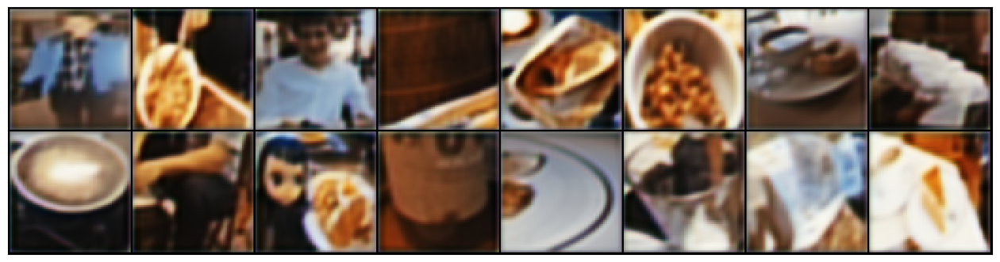

epoch [2/30], train_loss:0.0295, val_loss:0.0269


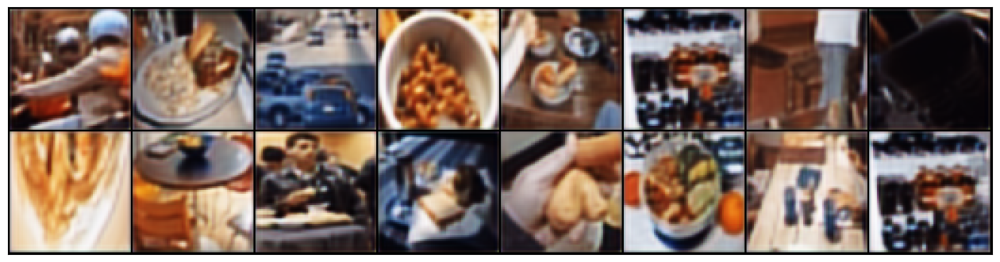

epoch [3/30], train_loss:0.0220, val_loss:0.0204


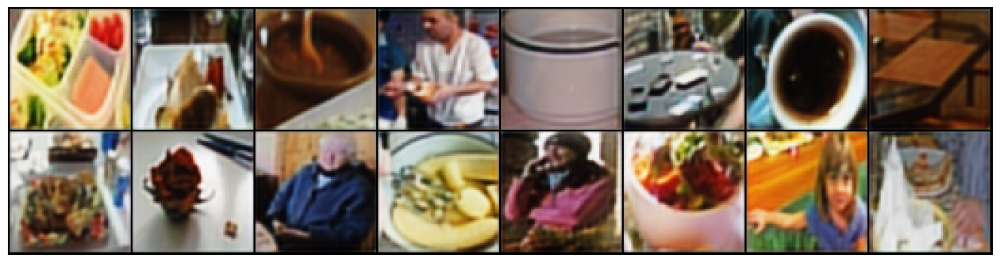

epoch [4/30], train_loss:0.0178, val_loss:0.0176


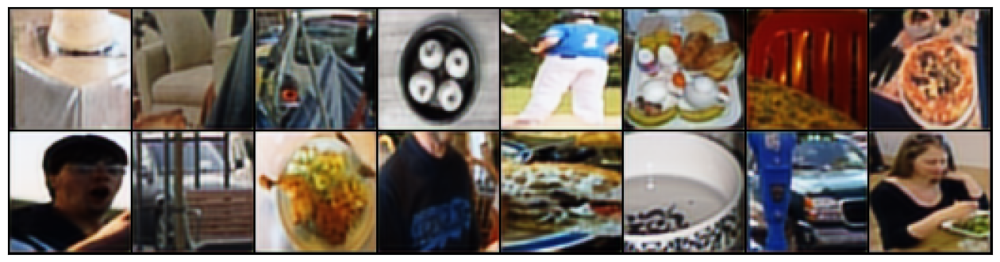

epoch [5/30], train_loss:0.0176, val_loss:0.0169


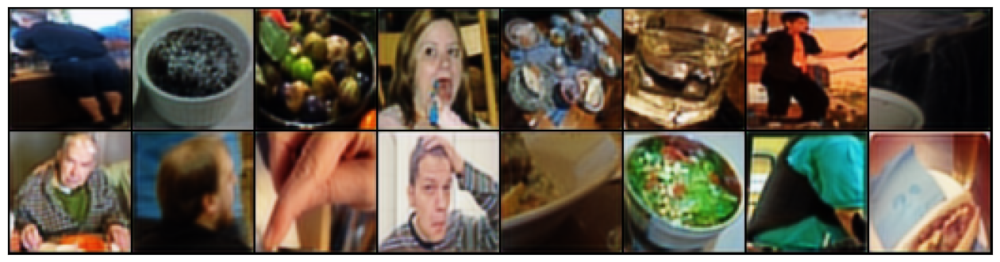

epoch [6/30], train_loss:0.0185, val_loss:0.0171


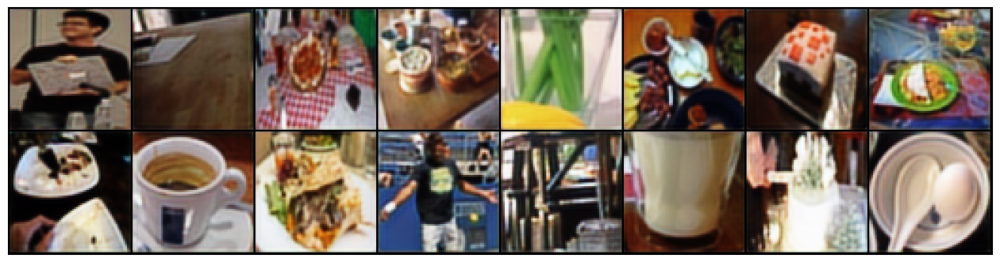

epoch [7/30], train_loss:0.0145, val_loss:0.0162


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


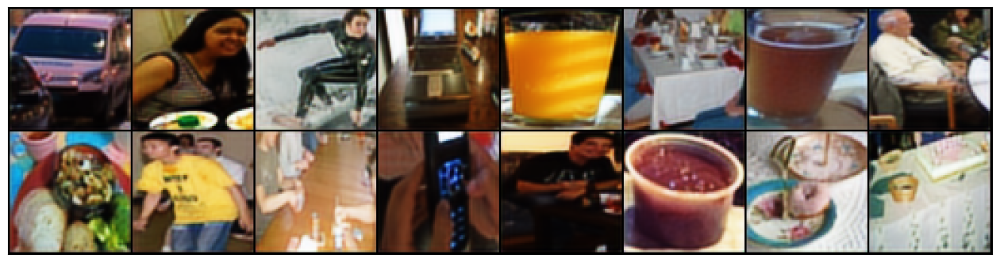

epoch [8/30], train_loss:0.0146, val_loss:0.0129


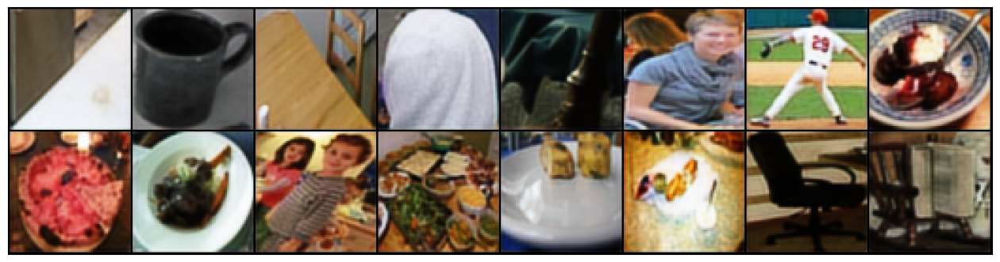

epoch [9/30], train_loss:0.0132, val_loss:0.0152


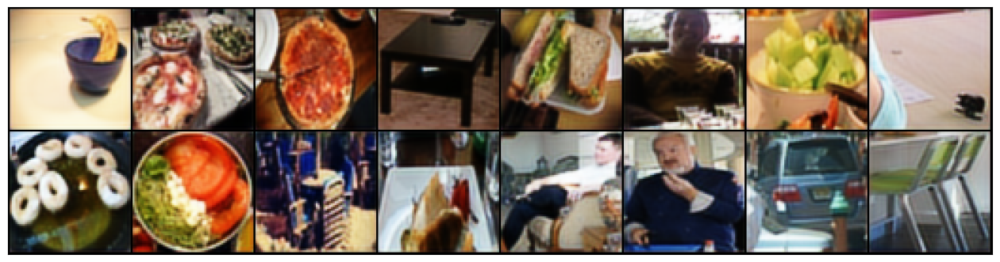

epoch [10/30], train_loss:0.0143, val_loss:0.0127


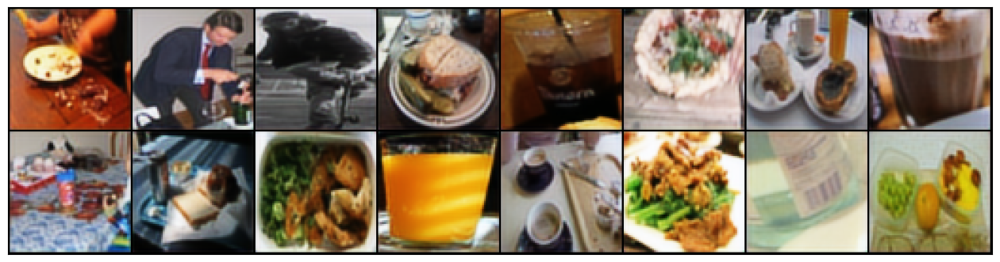

epoch [11/30], train_loss:0.0134, val_loss:0.0152


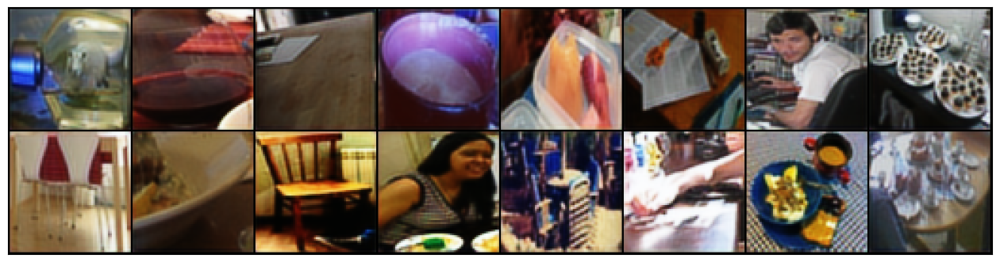

epoch [12/30], train_loss:0.0118, val_loss:0.0144


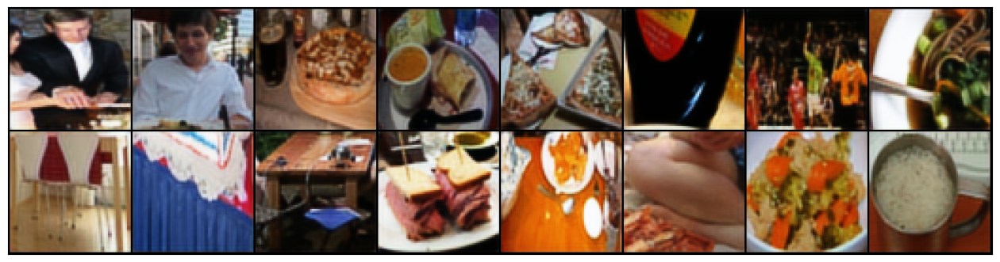

epoch [13/30], train_loss:0.0133, val_loss:0.0133


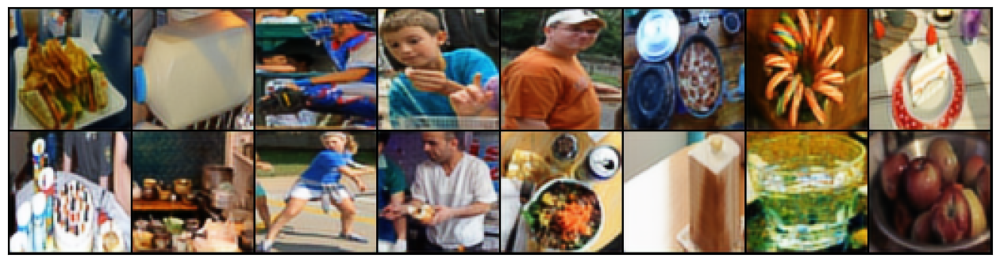

epoch [14/30], train_loss:0.0133, val_loss:0.0136


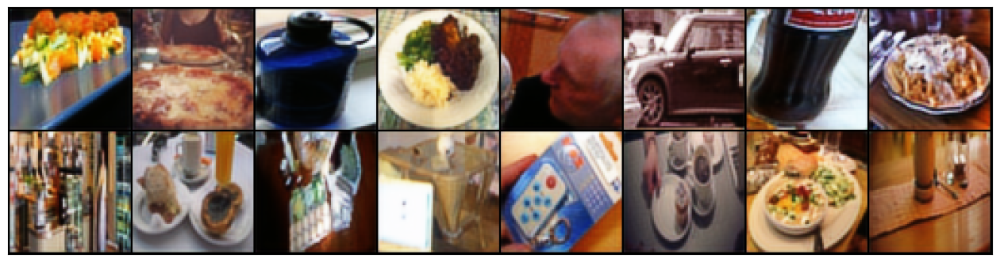

epoch [15/30], train_loss:0.0123, val_loss:0.0131


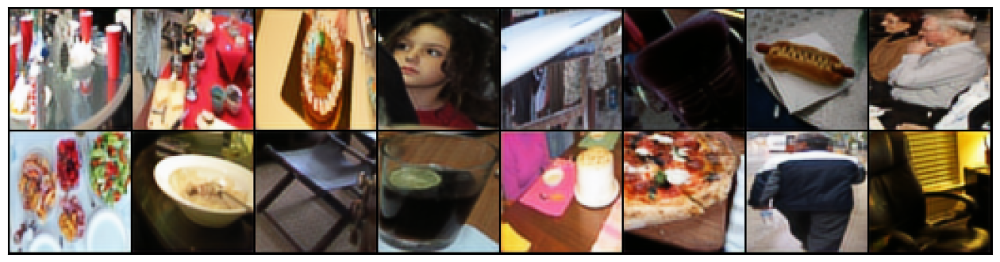

epoch [16/30], train_loss:0.0120, val_loss:0.0123


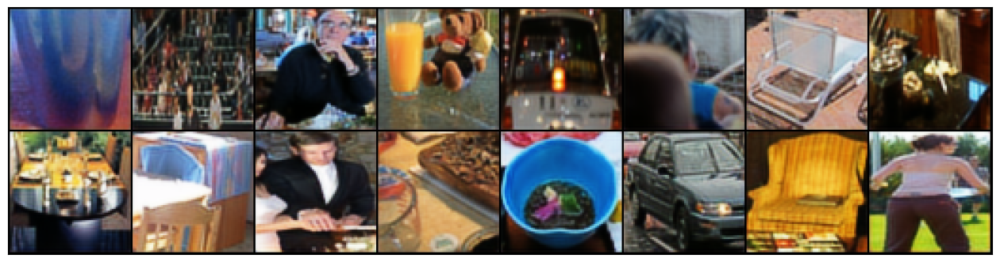

epoch [17/30], train_loss:0.0121, val_loss:0.0116


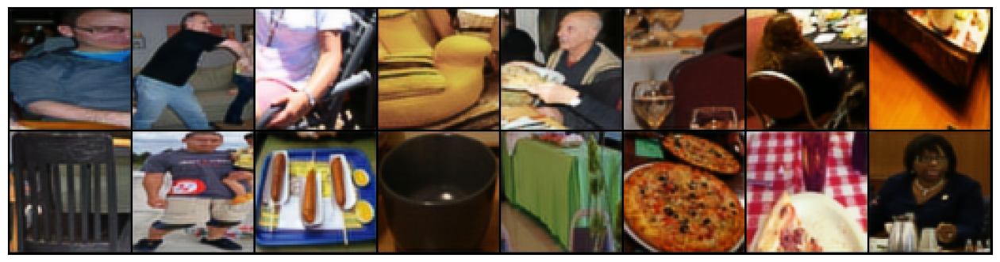

epoch [18/30], train_loss:0.0107, val_loss:0.0122


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


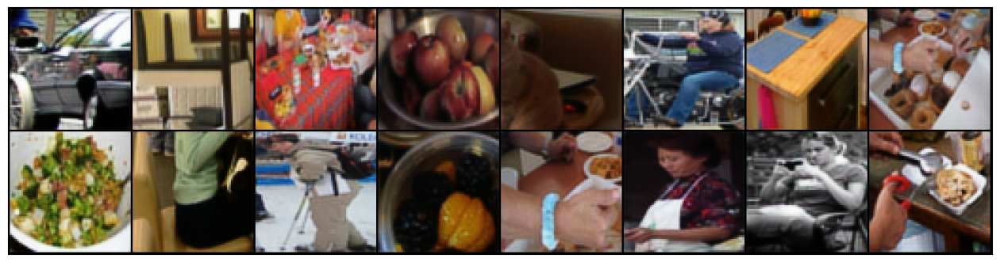

epoch [19/30], train_loss:0.0122, val_loss:0.0108


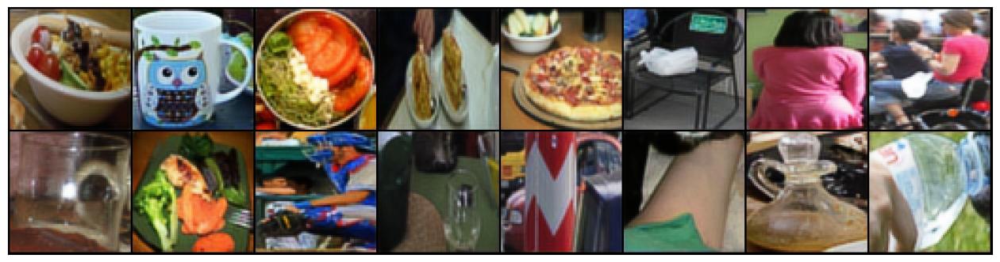

epoch [20/30], train_loss:0.0112, val_loss:0.0118


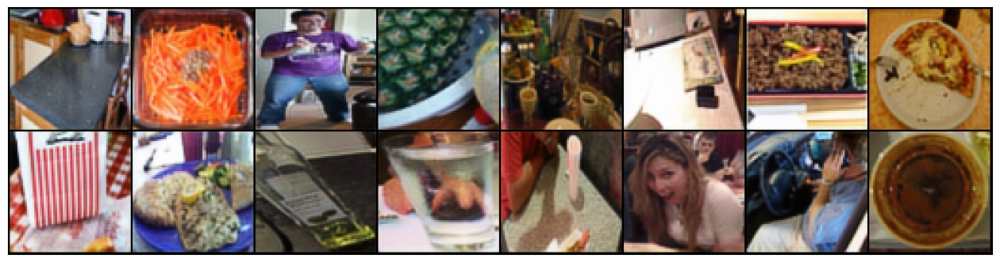

epoch [21/30], train_loss:0.0110, val_loss:0.0110


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


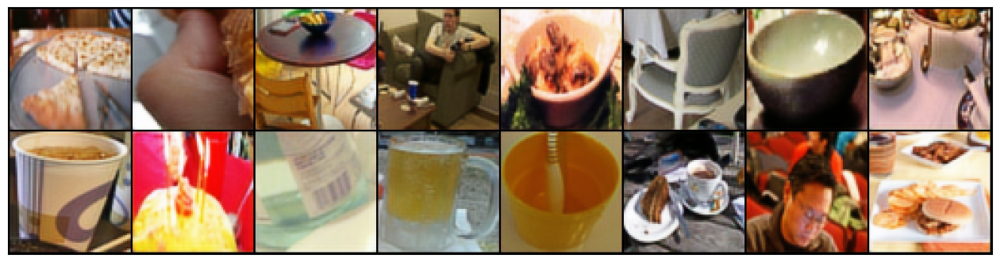

epoch [22/30], train_loss:0.0137, val_loss:0.0114


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


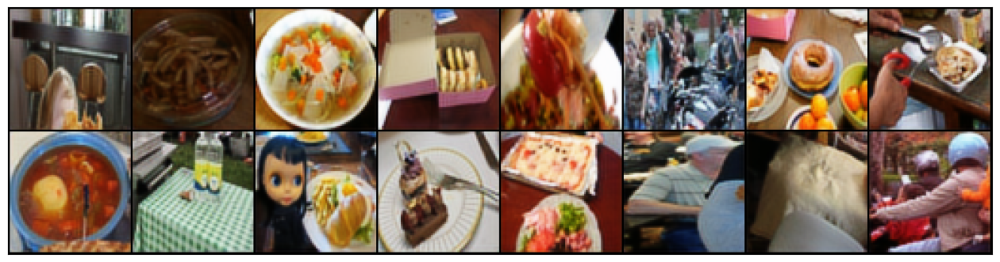

epoch [23/30], train_loss:0.0119, val_loss:0.0104


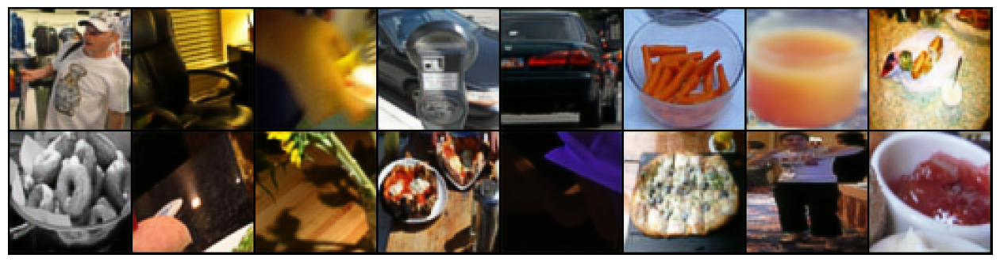

epoch [24/30], train_loss:0.0127, val_loss:0.0119


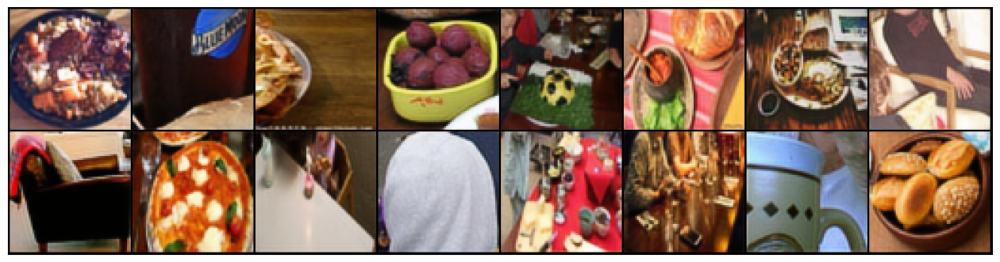

epoch [25/30], train_loss:0.0120, val_loss:0.0125


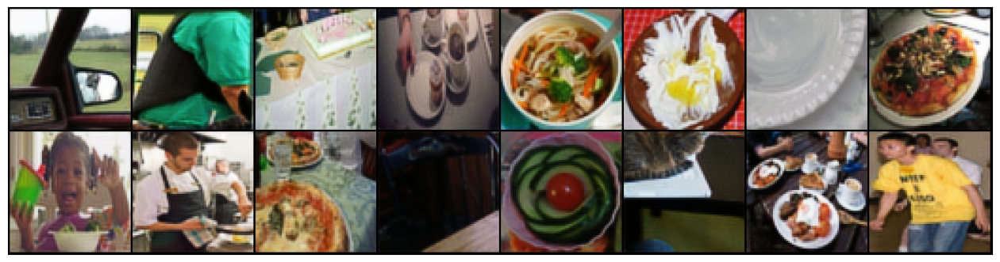

epoch [26/30], train_loss:0.0121, val_loss:0.0122


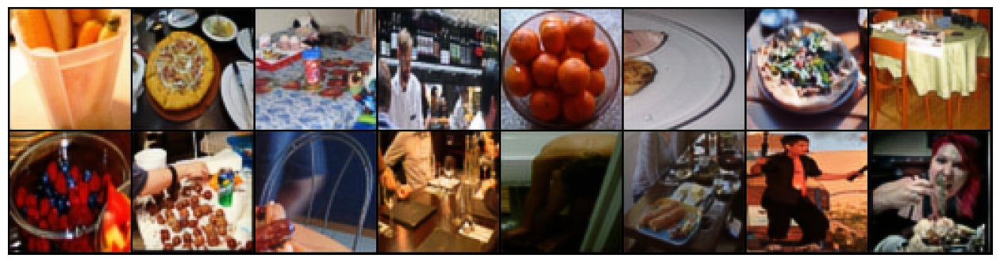

epoch [27/30], train_loss:0.0133, val_loss:0.0138


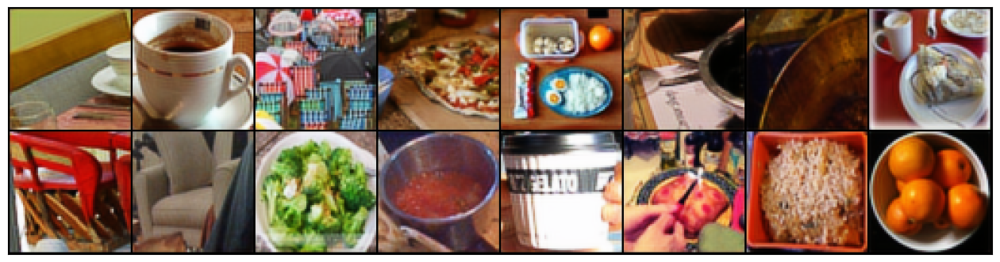

epoch [28/30], train_loss:0.0115, val_loss:0.0120


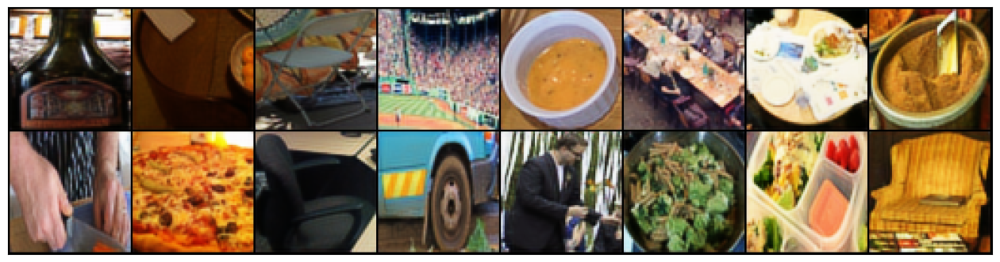

epoch [29/30], train_loss:0.0122, val_loss:0.0121


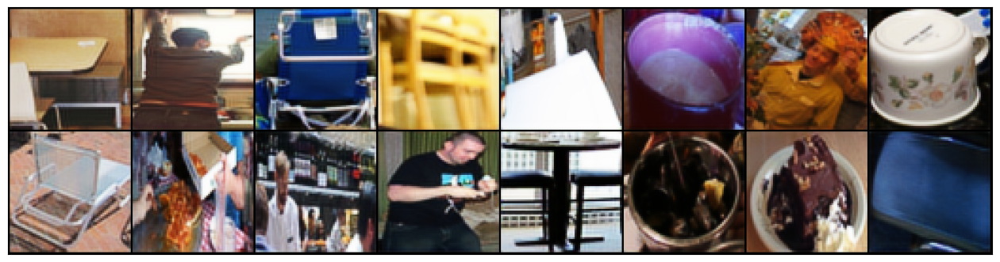

epoch [30/30], train_loss:0.0113, val_loss:0.0120


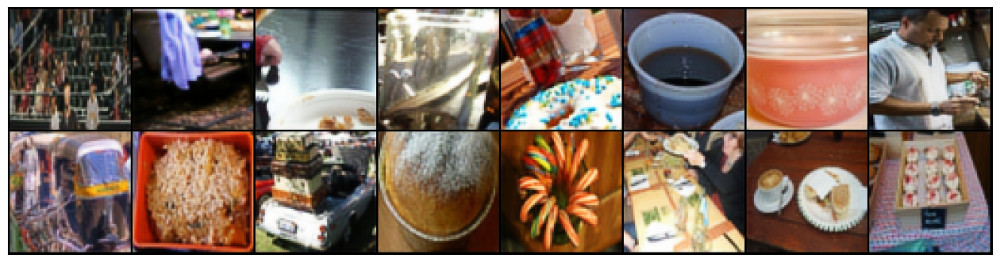

In [76]:
#Training the autoencoder

itr = 0 # remember to remove the objects folder
for epoch in range(num_epochs):
    for train_data in train_dataloader:
        img, _ = train_data        
        img = Variable(img)
        img = img.to(device)
        # Forward
        output,ldv = model(img)
        loss,r_loss,g_loss,b_loss = mse_loss(output, img)
        
        # Backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    for val_data in val_dataloader:
        val_img, _ = val_data        
        val_img = Variable(val_img)
        val_img = val_img.to(device)

        with torch.inference_mode():
            val_output,val_ldv= model(val_img)
            val_loss,val_r_loss,val_g_loss,val_b_loss = mse_loss(val_output, val_img)

    print('epoch [{}/{}], train_loss:{:.4f}, val_loss:{:.4f}'
          .format(epoch + 1, num_epochs, loss.data.item(),val_loss.data.item()))
    
    pic = to_img(val_output.detach().cpu().data)

    fig = plt.figure(figsize=(16, 16))

    ax = plt.imshow(np.transpose(vutils.make_grid(pic.to(device)[:16], padding=2, normalize=True).detach().cpu().numpy(),(1,2,0)))
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    plt.show(fig)

    

In [78]:
#Saving the trained model

torch.save(obj=model.state_dict(),f="/Users/krutikasavani/Video-search-local/Test/Trained_AutoEncoder.pth")

In [453]:
#Loading the trained model

model_ck1 = DeepResolutionAutoencoder().to(device)

In [454]:
#Loading the trained weights

model_ck1.load_state_dict(torch.load("/Users/krutikasavani/Video-search-local/Test/Trained_AutoEncoder.pth"))

<All keys matched successfully>

In [449]:
#Function to test the recontruction and to obtain the latent space representation of an image using the trained model

def reconstruct_image(img_path,set_model):

    img_open= Image.open(img_path)

    transform = transforms.Compose([transforms.Resize((128,128)),
                                    transforms.ToTensor()])
    
    img_transform= transform(img_open).unsqueeze(0)

    img_transform= img_transform.to(device)

    with torch.inference_mode():
        pred,ldv = set_model(img_transform)
    
    loss= mse_loss(pred,img_transform)

    pic = to_img(pred.to("cpu").data)

    plt.imshow(pic.squeeze(0).detach().cpu().numpy().transpose(1,2,0))

    #if ldv is True:
        #return loss,ldv

    return ldv.flatten(1,-1).squeeze(0).detach().cpu().numpy()


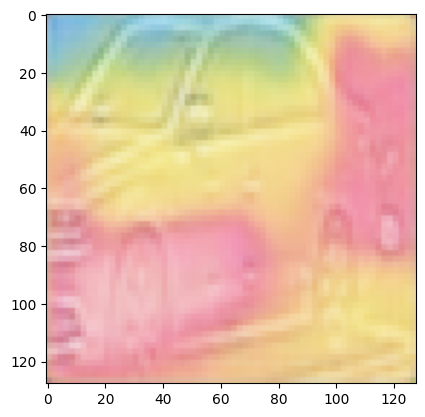

In [472]:
# Getting the latent space representation of the cropped objects and appending them into filetered_df 

cropped_objects_path= "/Users/krutikasavani/Video-search-local/Test/cropped_test_objects/"
vectors= []
for i in filtered_df["Object_file_name"]:
    img_path= cropped_objects_path + i + ".jpg"
    ldv = reconstruct_image(img_path=img_path,set_model=model_ck1)
    vectors.append(ldv)

filtered_df["Vectors"] = vectors


In [473]:
filtered_df.head(5)

,Video_ID,Frame_ID,Object_file_name,Object_ID,Class,Confidence_Score,Bbox_Info,Vectors
0,1,1-4,1-4-1,1,person,0.993100,"[511.833770752, 520.6685791016, 685.1188964844...","[0.13630983, 0.15196845, 0.15143573, 0.1433346..."
1,1,1-14,1-14-1,1,person,0.999307,"[0.0, 114.4297485352, 494.4271240234, 792.2802...","[0.1848772, 0.1978648, 0.18080118, 0.16028747,..."
2,1,1-15,1-15-1,1,person,0.999412,"[0.0, 114.101348877, 491.3519897461, 789.72827...","[0.18484323, 0.19819447, 0.18351397, 0.1620726..."
3,1,1-17,1-17-1,1,person,0.999388,"[3.8283996582, 134.8305969238, 515.2060546875,...","[0.18566172, 0.19755246, 0.17594074, 0.1722669..."
4,1,1-28,1-28-1,1,person,0.999278,"[5.7371826172, 129.1081542969, 519.1452636719,...","[0.18475416, 0.19644311, 0.17395636, 0.1747697..."


In [488]:
# Function to get the top k similar objects to the input image
def get_similarity(img_path,top_k,set_model):

    dist=[]
    ldv = reconstruct_image(img_path=img_path,set_model=set_model)

    for idx,i in enumerate(filtered_df["Vectors"]):
        distance_calc= distance.euclidean(ldv,i)
        object_class= filtered_df.iloc[idx,:]["Class"]
        dist.append((distance_calc,object_class))

        top_k_similarity= sorted(dist,reverse=True)[:top_k]
        top_k_similarity.append([i for i in dist if i[0] == 0.0])
    
    return top_k_similarity

[(4.7642011642456055, 'car'),
 (3.8848109245300293, 'person'),
 (3.8845815658569336, 'person'),
 (3.7704687118530273, 'person'),
 (3.7612266540527344, 'person'),
 [(0.0, 'person')]]

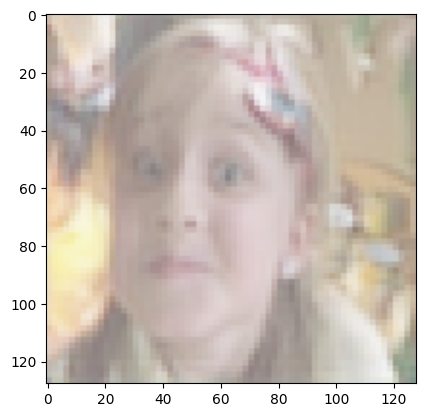

In [494]:
#Example 1
get_similarity(img_path="/Users/krutikasavani/Video-search-local/Test/cropped_test_objects/2-151-1.jpg",top_k=5,set_model=model_ck1)

[(8.201539993286133, 'person'),
 (8.162799835205078, 'person'),
 (8.105142593383789, 'person'),
 (8.078042984008789, 'person'),
 (8.0730619430542, 'person'),
 []]

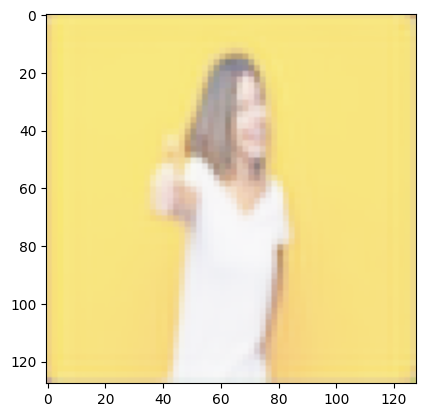

In [493]:
#Example 2

get_similarity(img_path="/Users/krutikasavani/Video-search-local/Test/person2.jpeg",top_k=5,set_model=model_ck1)

[(4.475829124450684, 'car'),
 (4.221193313598633, 'person'),
 (4.074275493621826, 'person'),
 (4.070052623748779, 'person'),
 (4.069734573364258, 'person'),
 []]

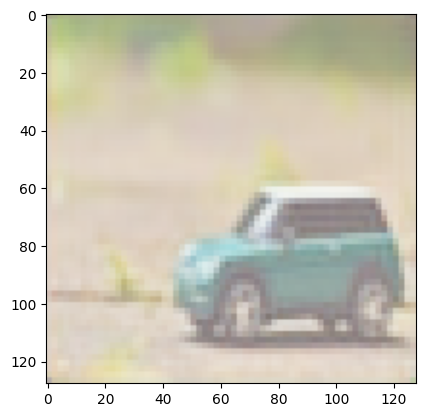

In [492]:
#Example 3

get_similarity(img_path="/Users/krutikasavani/Video-search-local/Test/car.jpeg",top_k=5,set_model=model_ck1)

In [440]:
#Connecting to psql database

host = "localhost"
dbname = "postgres"
user = "postgres"
password = "postgres"
sslmode = "disable"
port = "5432"

conn = psycopg2.connect(host=host, dbname=dbname, user=user, password=password, sslmode=sslmode, port=port)
conn.status

1

In [435]:
cursor = conn.cursor()
cursor.execute("CREATE EXTENSION IF NOT EXISTS vector;")
conn.commit()

In [441]:
#Creating table to store the embeddings

cursor = conn.cursor()
cursor.execute("CREATE TABLE video_embeddings(video_id VARCHAR, frame_id VARCHAR, frame_object_id VARCHAR PRIMARY KEY, object_id VARCHAR, class VARCHAR, confidence real, bbox1 real, bbox2 real, bbox3 real, bbox4 real, embeddings vector);")
conn.commit()

In [419]:
from psycopg2.extensions import register_adapter, AsIs

# Register numpy float32 datatype for our embedding values
def addapt_numpy_float32(numpy_float32):
    return AsIs(numpy_float32)
register_adapter(np.float32, addapt_numpy_float32)

In [429]:
embeddings= []

for i in range(len(filtered_df)):
    embeddings.append(filtered_df.iloc[i,:].to_list())


In [430]:
embeddings[0]

['1',
 '1-4',
 '1-4-1',
 '1',
 'person',
 0.9930999279,
 511.833770752,
 520.6685791016,
 685.1188964844,
 795.6614990234,
 array([-5.0519780e-06, -3.1602103e-06, -2.5839986e-06, ...,
         2.1655094e-02,  2.1664025e-02,  2.1227723e-02], dtype=float32)]

In [443]:
#Inserting the embeddings into the table

from psycopg2.extras import execute_values

# Connect to the PostgreSQL database

host = "localhost"
dbname = "postgres"
user = "postgres"
password = "postgres"
sslmode = "disable"
port = "5432"
query = """INSERT INTO video_embeddings (video_id, frame_id, frame_object_id, object_id, class, confidence, bbox1, bbox2, bbox3, bbox4, embeddings) VALUES %s"""
for i in range(len(filtered_df)): 
    try:
        # Iterate over each row in the DataFrame
        execute_values(cursor,query,embeddings)
    except Exception as e:
        print(e)
    conn.commit()

syntax error at or near "["
LINE 1: ...0752,520.6685791016,685.1188964844,795.6614990234,[-5.051978...
                                                             ^

syntax error at or near "["
LINE 1: ...0752,520.6685791016,685.1188964844,795.6614990234,[-5.051978...
                                                             ^

syntax error at or near "["
LINE 1: ...0752,520.6685791016,685.1188964844,795.6614990234,[-5.051978...
                                                             ^

syntax error at or near "["
LINE 1: ...0752,520.6685791016,685.1188964844,795.6614990234,[-5.051978...
                                                             ^

syntax error at or near "["
LINE 1: ...0752,520.6685791016,685.1188964844,795.6614990234,[-5.051978...
                                                             ^

syntax error at or near "["
LINE 1: ...0752,520.6685791016,685.1188964844,795.6614990234,[-5.051978...
                                                             ^